In [1]:
import scanpy as  sc
import anndata as ad
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import palantir
import plotly.express as px
import pandas as pd
sc.settings.figdir = ''
print('import successful')

import successful


In [2]:
###function###
def run_dpt(adata,root_cell_id,dataset):
    # 计算扩散伪时间 (DPT)
    root_cell_id = root_cell_id  # 替换为你的细胞ID
    root_cell_index = adata.obs.index.get_loc(root_cell_id)
    adata.uns['iroot'] = root_cell_index
    sc.tl.paga(adata, groups='leiden')
    #sc.pl.paga(adata, plot=True)
    sc.tl.dpt(adata)
    sc.pl.umap(adata, color=['dpt_pseudotime',"newcelltype", "celltype",'sample','stage','gland'],ncols=3,save=f'dpt{dataset}.png')

In [3]:
def run_plotly(adata):
    # 提取UMAP数据
    umap_data = pd.DataFrame(adata.obsm['X_umap'], columns=['UMAP1', 'UMAP2'])
    umap_data['cell_ids'] = adata.obs.index  # 细胞的ID
    umap_data['stage'] = adata.obs['stage']  # 聚类信息

# 使用plotly创建交互式UMAP图
    fig = px.scatter(umap_data, x='UMAP1', y='UMAP2', hover_data=['cell_ids', 'stage'],width=1000,height=1000)
    fig.show()

In [21]:
###global variable###
dataset = 'R-AG'
h5adpath = f'../1.subset/{dataset}_cleaned.h5ad'
ifuse_subset = False
terminal_states = pd.Series(
    ['Basal', 'LumSEC-AG-t2'],
    index=["R-AG-LA-CATACCCTCTTGATTC", "R-AG-25WK-2-CTGCCATAGAATTTGG"],
)
genes = 'Top2a,Lef1,Epcam,Acta2,Lalba,Elf5,Esr1,Prlr'
subset_cluster = ''
root_cell_id = ['R-AG-E26-TCGGTCTGTGAGATCG']
n_genes = 30
drop_cells=True
droplist=[
#'ASC-rb',
#'Basal',
'Epi-Krt7',
'Epi-Lgals7',
'Epi-Pro',
# 'LumSEC-AG-t1',
# 'LumSEC-AG-t2'
         ]
cores=8


In [10]:
#h5adpath = f'D:/111/M-MG_cleaned.h5ad'

In [11]:
ea = ad.read_h5ad(h5adpath)

In [12]:
if drop_cells:
    ea=ea[~ea.obs['newcelltype'].isin(droplist)]
    print(f"drop cells : {droplist}")
else:
    print("skip drop cells")

drop cells : ['Lum-Fib-like', 'Lum-Imm-like', 'Lum-Adi-like', 'Lum-Ker-like']


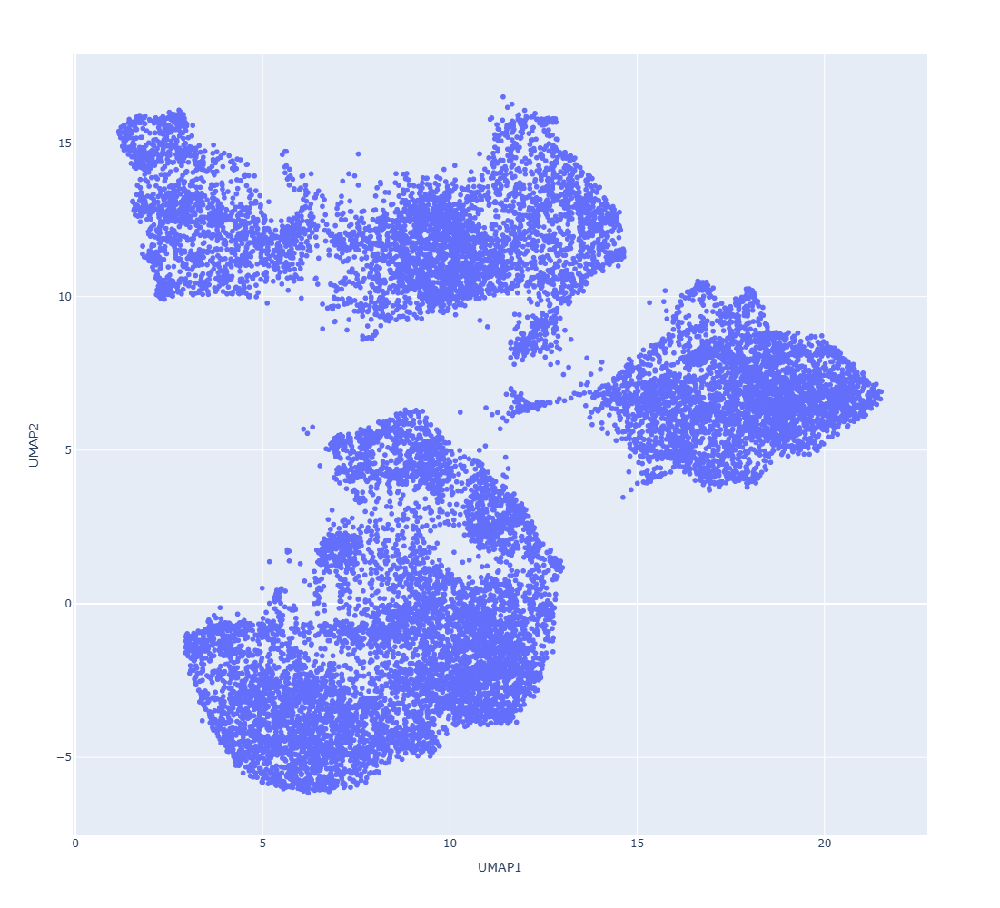

In [13]:
run_plotly(ea)

In [15]:
if ifuse_subset:
    ea_subset = ea[ea.obs['leiden'].isin(subset_cluster.split(','))].copy()
else:
    ea_subset = ea

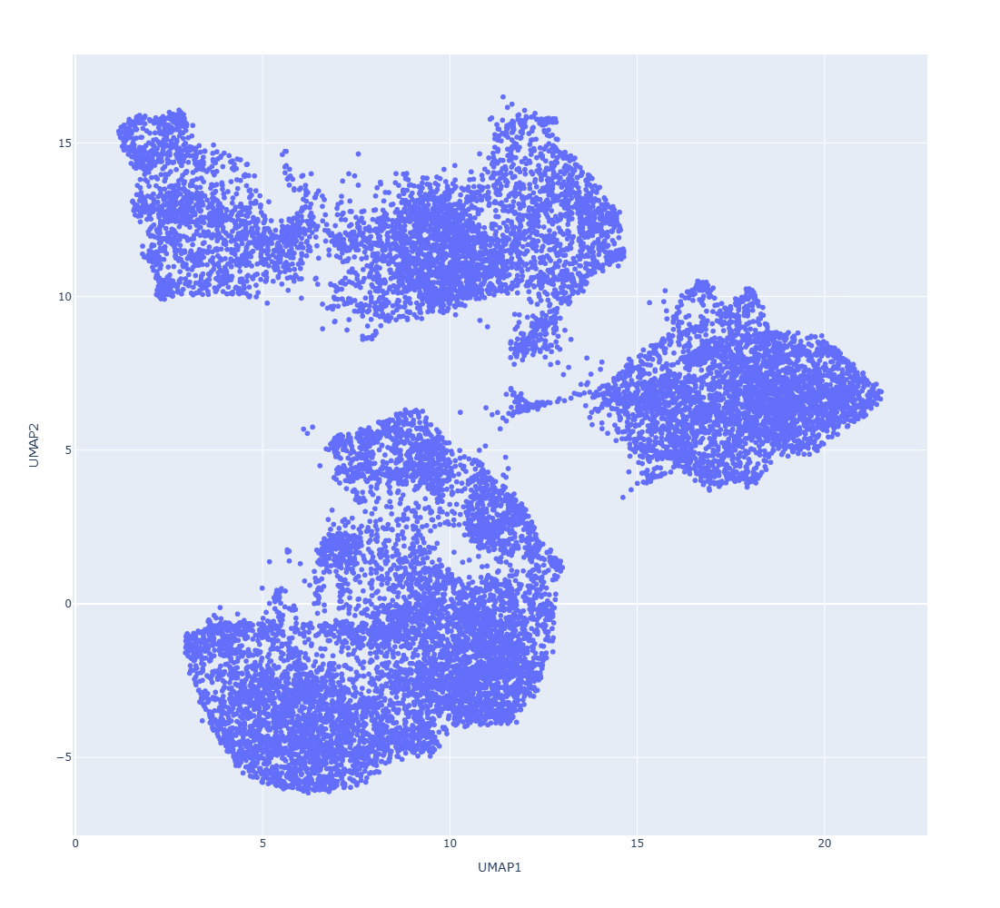

In [16]:
run_plotly(ea_subset)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_18312\1900109911.py:6: ImplicitModificationWarning:

Trying to modify attribute `._uns` of view, initializing view as actual.



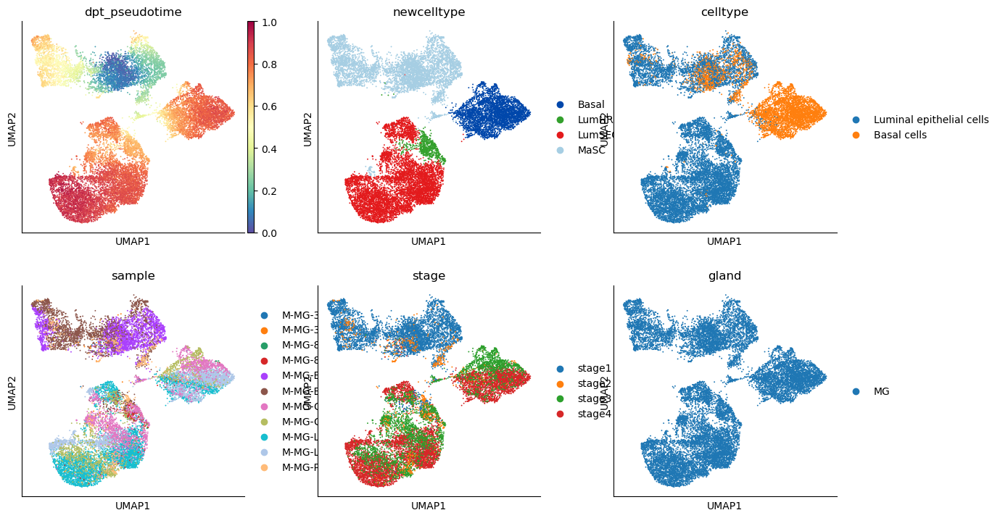

In [19]:
run_dpt(ea_subset,root_cell_id = root_cell_id,dataset=dataset)

In [22]:
dm_res = palantir.utils.run_diffusion_maps(ea_subset)
ms_data = palantir.utils.determine_multiscale_space(ea_subset)
imputed_X = palantir.utils.run_magic_imputation(ea_subset)

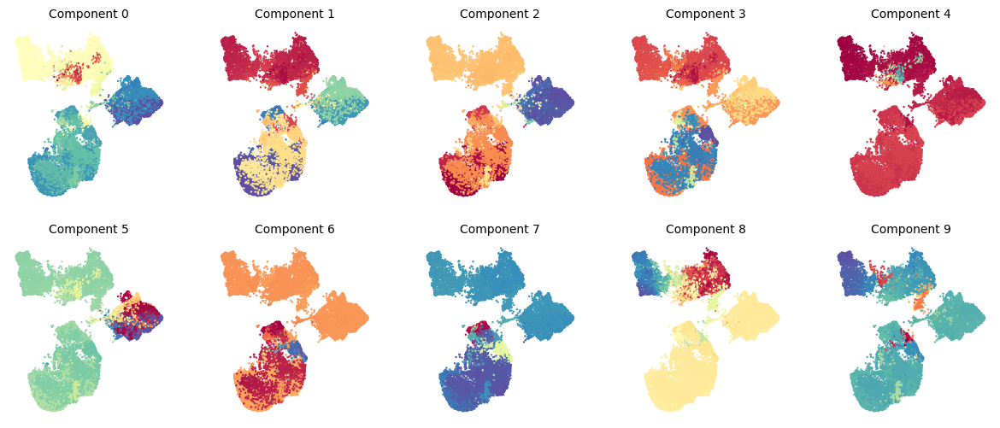

In [23]:
palantir.plot.plot_diffusion_components(ea_subset)
plt.show()

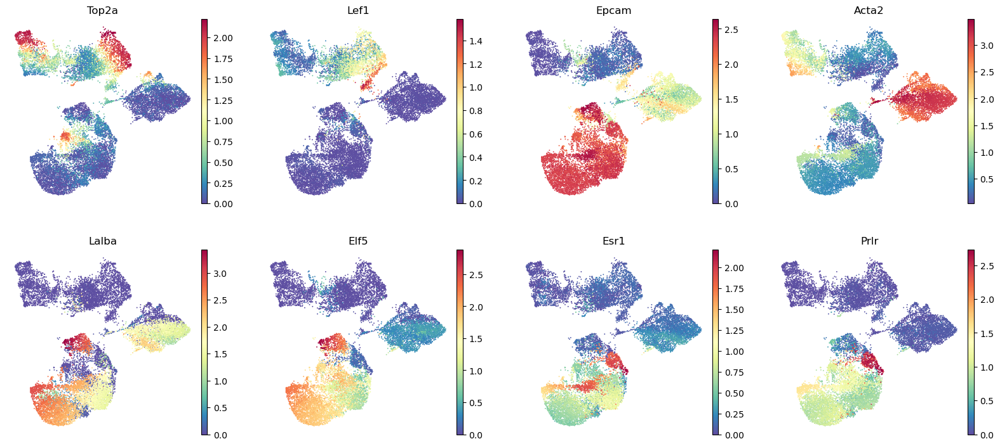

In [24]:
sc.pl.embedding(
    ea_subset,
    basis="umap",
    color=genes.split(','),
    frameon=False,
    layer="MAGIC_imputed_data",
    save=f'{dataset}_MAGIC_featureplot.png'
)


(<Figure size 400x400 with 1 Axes>, <Axes: >)

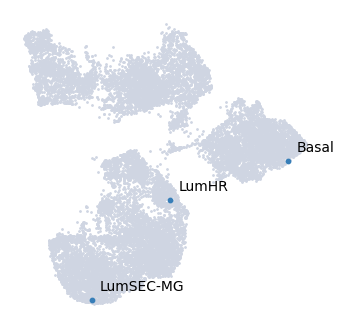

In [25]:
palantir.plot.highlight_cells_on_umap(ea_subset, terminal_states)

In [26]:
start_cell = root_cell_id
pr_res = palantir.core.run_palantir(
    ea_subset, start_cell, num_waypoints=500,terminal_states=terminal_states,n_jobs=cores,seed=2024
)

Sampling and flocking waypoints...
Time for determining waypoints: 0.011966713269551595 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


C:\Users\Lenovo\miniconda3\envs\py310\lib\site-packages\palantir\core.py:558: UserWarning:

Some of the cells were unreachable. Consider increasing the k for 
             nearest neighbor graph construction.



Time for shortest paths: 0.3420007665952047 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [27]:
palantir.plot.plot_palantir_results(ea_subset, s=3,)
plt.savefig(f"{dataset}_palantir_result.png")
plt.close()

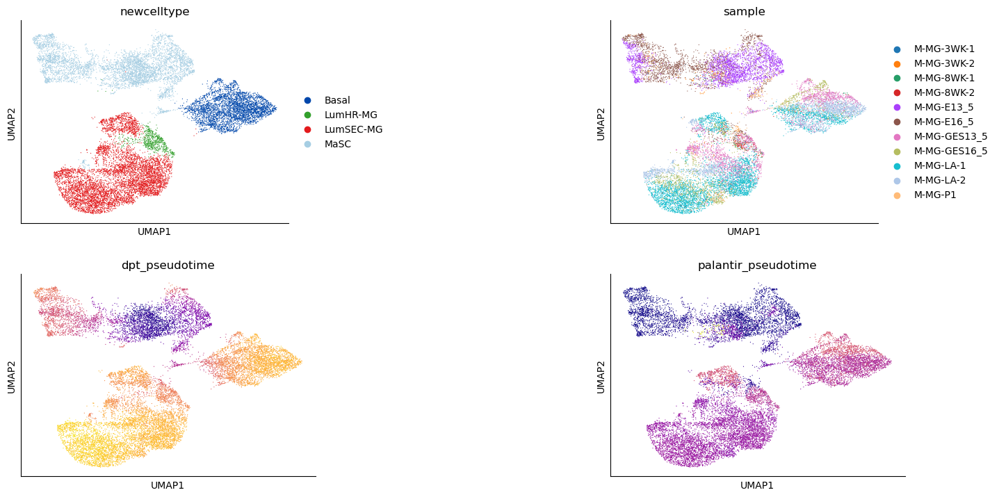

In [106]:
    sc.pl.umap(
        ea_subset,
        color=["newcelltype",'sample','dpt_pseudotime','palantir_pseudotime'],
        # increase horizontal space between panels
        wspace=1,
        size=3,
    ncols=2,
    save=f'{dataset}_all_pse.pdf',
    color_map='plasma',
    )

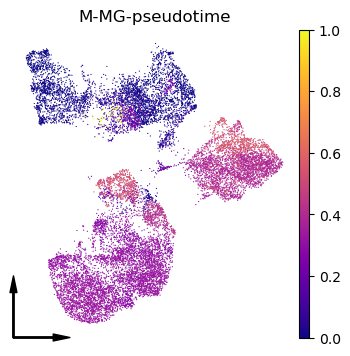

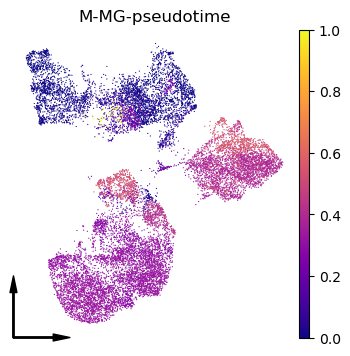

In [79]:
def plot_umap_without_borders(ea, dataset, color):
    """
    绘制没有边框、标题的 UMAP 图，在左下角添加一个坐标轴。
    返回 Figure 对象。
    """

    # 使用 scanpy 的绘图函数，返回 Figure 对象
    fig = sc.pl.umap(
        ea,
        color=color,
        size=3,
        show=False,          # 不直接展示
        return_fig=True,cmap="plasma"      # 返回 Figure 对象
    )

    # 获取主绘图区
    ax = fig.axes[0]

    # 删除标题
    ax.set_title(f"{dataset}-{color}")

    # 删除坐标轴刻度和标签
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")

    # 删除边框
    for spine in ax.spines.values():
        spine.set_visible(False)

    # 在左下角添加一个坐标轴
    arrow_length = 0.2  # 坐标轴长度
    arrow_x_start = 0.05  # 箭头起点的 x 坐标（相对轴的范围）
    arrow_y_start = 0.05  # 箭头起点的 y 坐标

    # 绘制箭头（UMAP1）
    ax.annotate(
        "", xy=(arrow_length, 0), xytext=(0, 0),
        arrowprops=dict(facecolor="black", shrink=0, width=1, headwidth=5),
        xycoords="axes fraction", textcoords="axes fraction",
        annotation_clip=False
    )

    # 绘制箭头（UMAP2）
    ax.annotate(
        "", xy=(0, arrow_length), xytext=(0, 0),
        arrowprops=dict(facecolor="black", shrink=0, width=1, headwidth=5),
        xycoords="axes fraction", textcoords="axes fraction",
        annotation_clip=False
    )
    # 返回修改后的 Figure
    return fig
fig=plot_umap_without_borders(ea, dataset=dataset, color="palantir_pseudotime")
fig.savefig(f"{dataset}_palantir_pseudotime.png",dpi=200)
fig.savefig(f"{dataset}_palantir_pseudotime.pdf",dpi=300)
fig=plot_umap_without_borders(ea, dataset=dataset, color="dpt_pseudotime")
fig.savefig(f"{dataset}_DPT_pseudotime.png",dpi=200)
fig.savefig(f"{dataset}_DPT_pseudotime.pdf",dpi=300)


In [29]:
masks = palantir.presults.select_branch_cells(ea_subset, q=.01, eps=.01)

In [30]:
palantir.plot.plot_branch_selection(ea_subset)
plt.savefig(f"{dataset}_branch_selection.png")
plt.close()

In [31]:
#palantir.plot.plot_trajectory(ea_subset, "LumHR")
#plt.savefig(f"{dataset}_11.png")

[2025-01-16 14:25:03,582] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (8,663) and rank = 1.0.
[2025-01-16 14:25:03,582] [INFO    ] Using covariance function Matern52(ls=0.9136648178100586).
[2025-01-16 14:25:03,582] [INFO    ] Computing 50 landmarks with k-means clustering.


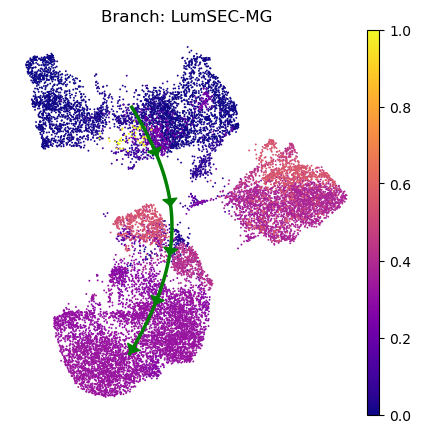

[2025-01-16 14:25:05,317] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (5,322) and rank = 1.0.
[2025-01-16 14:25:05,317] [INFO    ] Using covariance function Matern52(ls=0.9136648178100586).
[2025-01-16 14:25:05,317] [INFO    ] Computing 50 landmarks with k-means clustering.


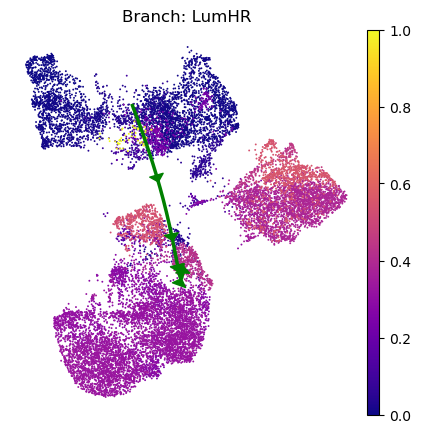

[2025-01-16 14:25:07,002] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (7,175) and rank = 1.0.
[2025-01-16 14:25:07,004] [INFO    ] Using covariance function Matern52(ls=0.9136648178100586).
[2025-01-16 14:25:07,005] [INFO    ] Computing 50 landmarks with k-means clustering.


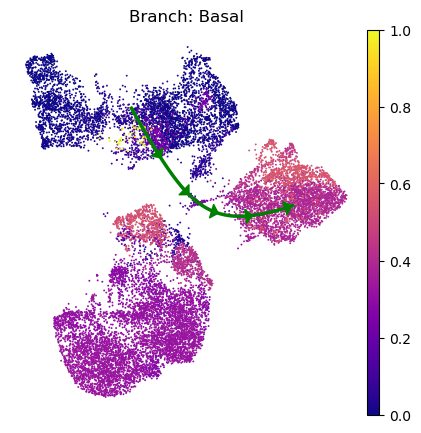

In [83]:
for celltype in terminal_states.unique():
    palantir.plot.plot_trajectory(
    ea_subset,
    celltype,
    cell_color="palantir_pseudotime",
    n_arrows=5,
    color="green",
    scanpy_kwargs=dict(cmap="plasma"),
    arrowprops=dict(arrowstyle="-|>,head_length=.5,head_width=.5"),smoothness=0.8
    )
    plt.savefig(f"{dataset}_{celltype}_branch.png")
    plt.savefig(f"{dataset}_{celltype}_branch.pdf",dpi=300)
    plt.show()
    plt.close()

[2025-01-16 15:03:02,873] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (8,663) and rank = 1.0.
[2025-01-16 15:03:02,875] [INFO    ] Using covariance function Matern52(ls=0.9136648178100586).
[2025-01-16 15:03:02,876] [INFO    ] Computing 50 landmarks with k-means clustering.
[2025-01-16 15:03:02,999] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (5,322) and rank = 1.0.
[2025-01-16 15:03:03,000] [INFO    ] Using covariance function Matern52(ls=0.9136648178100586).
[2025-01-16 15:03:03,001] [INFO    ] Computing 50 landmarks with k-means clustering.
[2025-01-16 15:03:03,090] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (7,175) and rank = 1.0.
[2025-01-16 15:03:03,090] [INFO    ] Using covariance function Matern52(ls=0.9136648178100586).
[2025-01-16 15:03:03,090] [INFO    ] Computing 50 landmarks with k-means clustering.


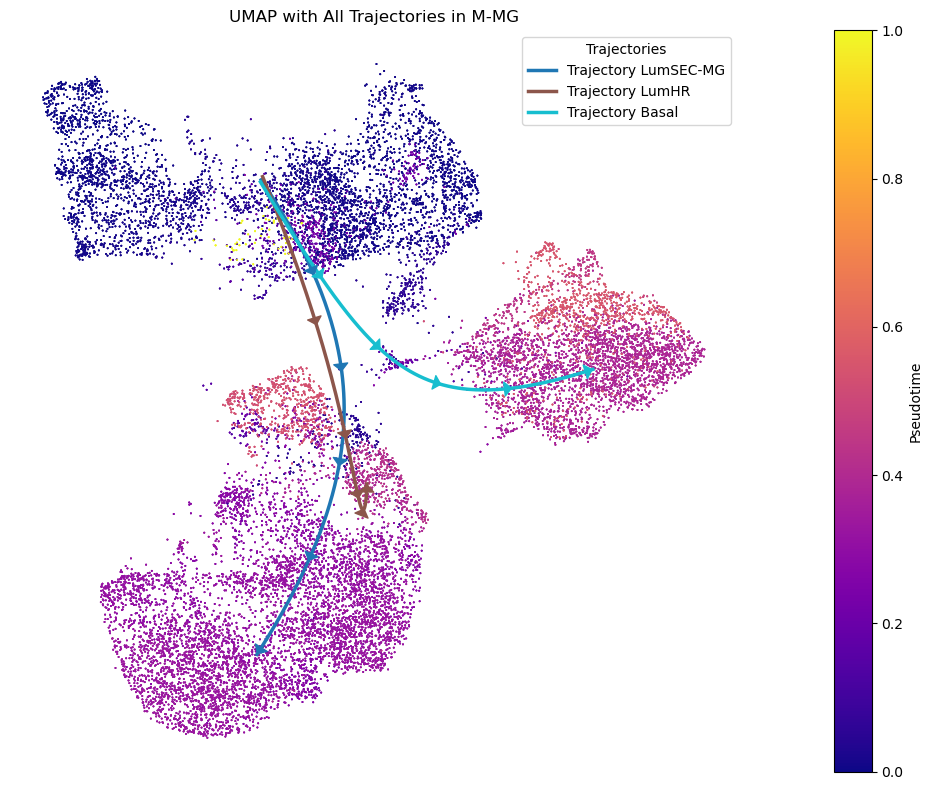

In [108]:
# 定义轨迹颜色映射
trajectory_colors = plt.cm.tab10(np.linspace(0, 1, len(terminal_states.unique())))

# 创建共享的图像和轴
fig, ax = plt.subplots(figsize=(10, 8))

# 绘制所有轨迹叠加在一起
for i, celltype in enumerate(terminal_states.unique()):
    palantir.plot.plot_trajectory(
        ea_subset,
        celltype,
        cell_color="palantir_pseudotime",
        n_arrows=5,
        color=trajectory_colors[i],  # 每条轨迹分配不同颜色
        scanpy_kwargs=dict(cmap="plasma",colorbar_loc=None),
        arrowprops=dict(arrowstyle="-|>,head_length=.5,head_width=.5"),
        smoothness=0.8,
        ax=ax  # 将轨迹绘制到共享的 Axes 上
    )

# 添加 pseudotime 的颜色条
sm = plt.cm.ScalarMappable(cmap="plasma", norm=plt.Normalize(vmin=ea_subset.obs["palantir_pseudotime"].min(), 
                                                              vmax=ea_subset.obs["palantir_pseudotime"].max()))
cbar = fig.colorbar(sm, ax=ax, orientation="vertical", pad=0.1)
cbar.set_label("Pseudotime")

# 添加轨迹图例
legend_labels = [f"Trajectory {celltype}" for celltype in terminal_states.unique()]
for i, label in enumerate(legend_labels):
    ax.plot([], [], color=trajectory_colors[i], label=label)  # 虚拟线条用于图例
ax.legend(title="Trajectories", loc="best")

# 添加标题和轴标签
ax.set_title(f"UMAP with All Trajectories in {dataset}")
ax.set_xlabel("UMAP1")
ax.set_ylabel("UMAP2")

# 保存叠加图
plt.tight_layout()
plt.savefig(f"{dataset}_combined_trajectories.png")
plt.savefig(f"{dataset}_combined_trajectories.pdf", dpi=300)
plt.show()

In [32]:
ea_subset.write(f"{dataset}.palantir_finished.h5ad")

In [34]:
highly_variable_genes = ea_subset.var[ea_subset.var['highly_variable']]
top_genes = highly_variable_genes.dropna(subset=['highly_variable_rank']).sort_values(by='highly_variable_rank').head(n_genes)

In [35]:
gene_trends = palantir.presults.compute_gene_trends(
    ea_subset[:,top_genes.index],
    expression_key="MAGIC_imputed_data"
)

LumHR
[2024-12-04 14:34:27,661] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (9,844) and rank = 1.0.
[2024-12-04 14:34:27,662] [INFO    ] Using covariance function Matern52(ls=1.0).


C:\Users\Lenovo\miniconda3\envs\py310\lib\site-packages\palantir\presults.py:316: ImplicitModificationWarning:

Setting element `.varm['gene_trends_LumHR']` of view, initializing view as actual.



LumSEC type1
[2024-12-04 14:34:29,702] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (12,274) and rank = 1.0.
[2024-12-04 14:34:29,703] [INFO    ] Using covariance function Matern52(ls=1.0).


In [36]:
for trajectory in gene_trends.keys():
    trends = gene_trends[trajectory]['trends']
    peak_time = trends.idxmax(axis=1)
    sorted_trends = trends.loc[peak_time.sort_values().index]
    gene_trends[trajectory]['trends'] = sorted_trends

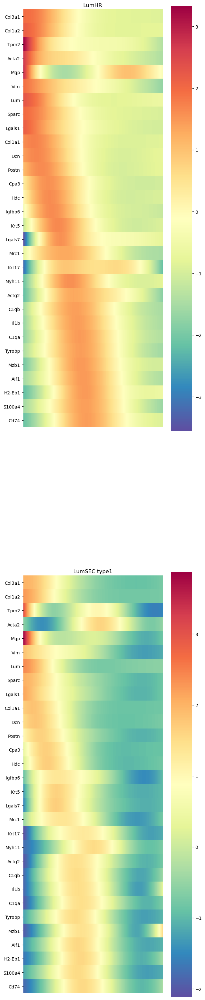

In [37]:
palantir.plot.plot_gene_trend_heatmaps(gene_trends)
plt.savefig(f'{dataset}_geneHeatmap.png')
plt.savefig(f'{dataset}_geneHeatmap.pdf',dpi=300)
plt.show()
plt.close()

LumHR
[2024-12-04 14:34:31,428] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (9,844) and rank = 1.0.
[2024-12-04 14:34:31,429] [INFO    ] Using covariance function Matern52(ls=1.0).


C:\Users\Lenovo\miniconda3\envs\py310\lib\site-packages\palantir\presults.py:316: ImplicitModificationWarning:

Setting element `.varm['gene_trends_LumHR']` of view, initializing view as actual.



LumSEC type1
[2024-12-04 14:34:32,246] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (12,274) and rank = 1.0.
[2024-12-04 14:34:32,246] [INFO    ] Using covariance function Matern52(ls=1.0).


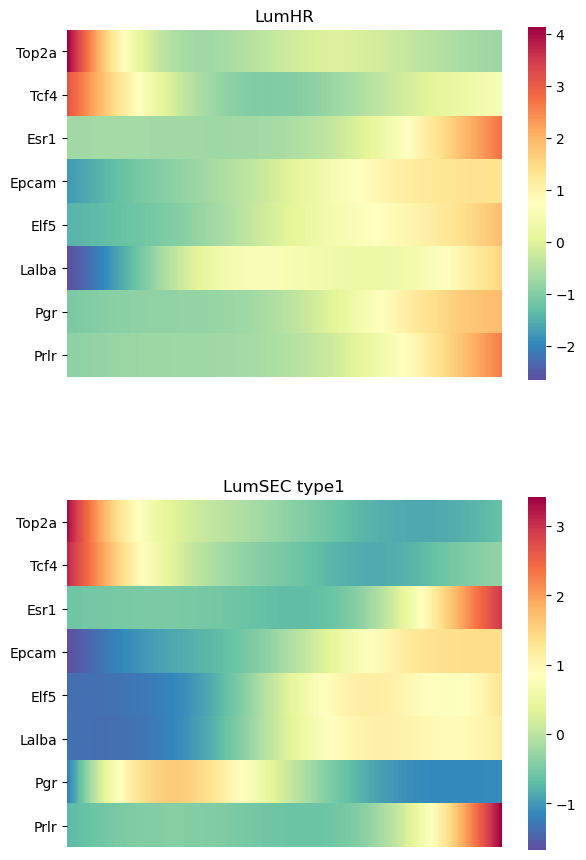

In [38]:
gene_trends2 = palantir.presults.compute_gene_trends(
    ea_subset[:,genes.split(',')],
    expression_key="MAGIC_imputed_data"
)
palantir.plot.plot_gene_trend_heatmaps(gene_trends2)
plt.savefig(f'{dataset}_geneHeatmap_spefic.png')
plt.savefig(f'{dataset}_geneHeatmap_spefic.pdf',dpi=300)
plt.close()